In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
from shapely.geometry import Point
from sqlalchemy import create_engine
from dotenv import load_dotenv
import os

In [2]:
#LOAD DATASET USING SQL QUERY
load_dotenv()
engine = create_engine(os.getenv("SUPABASE_DB_URL"))

In [3]:
with engine.connect() as conn:
    df_avg_trip = pd.read_sql("""WITH completed_trips AS (
  SELECT
        t.trip_id,
        t.pickup_datetime,
        t.dropoff_datetime,
        t.pickup_latitude,
        t.pickup_longitude,
        t.dropoff_latitude,
        t.dropoff_longitude,
        t.distance_km,
        t.duration_minutes,
        t.vehicle_type,
        t.fare_amount,
        t.surge_multiplier,

        -- Join ke admin boundary
        pup."NAME_4" AS pickup_admin,
        dof."NAME_4" AS dropoff_admin,

        -- Join ke geohash grid
        p.geohash_list AS pickup_geohash,
        d.geohash_list AS dropoff_geohash

    FROM
        jakarta_ride_trips AS t

    -- Join ke admin kelurahan untuk pickup
    LEFT JOIN id_adm_4 AS pup
        ON ST_Contains(
            pup.geometry,
            ST_SetSRID(ST_Point(t.pickup_longitude, t.pickup_latitude), 4326)
        )

    -- Join ke admin kelurahan untuk dropoff
    LEFT JOIN id_adm_4 AS dof
        ON ST_Contains(
            dof.geometry,
            ST_SetSRID(ST_Point(t.dropoff_longitude, t.dropoff_latitude), 4326)
        )

    -- Join ke geohash area pickup
    LEFT JOIN id_jkt_geohash7 AS p
        ON ST_Intersects(
            p.geometry,
            ST_SetSRID(ST_Point(t.pickup_longitude, t.pickup_latitude), 4326)
        )

    -- Join ke geohash area dropoff
    LEFT JOIN id_jkt_geohash7 AS d
        ON ST_Intersects(
            d.geometry,
            ST_SetSRID(ST_Point(t.dropoff_longitude, t.dropoff_latitude), 4326)
        )

)
SELECT * FROM completed_trips""",conn)
    df_admin_jkt = pd.read_sql("""
SELECT 
  "NAME_1",
  "NAME_2",
  "NAME_3",
  "NAME_4",
  ST_AsText(geometry) AS wkt_geom
FROM 
  id_adm_4
WHERE
  "NAME_1" in ('Jakarta Raya')""",conn)

In [4]:
df_admin_jkt.head()

,NAME_1,NAME_2,NAME_3,NAME_4,wkt_geom
0,Jakarta Raya,Jakarta Selatan,Setiabudi,Kuningan Timur,MULTIPOLYGON(((106.83233642600004 -6.240016936...
1,Jakarta Raya,Jakarta Selatan,Setiabudi,Menteng Atas,MULTIPOLYGON(((106.83046722400007 -6.210614203...
2,Jakarta Raya,Jakarta Selatan,Tebet,Bukit Duri,MULTIPOLYGON(((106.86355590700003 -6.225083349...
3,Jakarta Raya,Jakarta Selatan,Tebet,Kebon Baru,MULTIPOLYGON(((106.86249542200011 -6.243099211...
4,Jakarta Raya,Jakarta Selatan,Tebet,Manggarai,MULTIPOLYGON(((106.84815216000015 -6.207920072...


In [5]:
df_avg_trip.head()

,trip_id,pickup_datetime,dropoff_datetime,pickup_latitude,pickup_longitude,dropoff_latitude,dropoff_longitude,distance_km,duration_minutes,vehicle_type,fare_amount,surge_multiplier,pickup_admin,dropoff_admin,pickup_geohash,dropoff_geohash
0,1,2024-01-01 00:00:00+00:00,2024-01-01 00:15:00+00:00,-6.225092,106.798409,-6.225272,106.824918,8.46,28.7,premium_car,39951.0,1.71,Gelora,Kuningan Timur,qqguw6b,qqguwfe
1,2,2024-01-01 00:03:00+00:00,2024-01-01 00:18:00+00:00,-6.109857,106.818359,-6.233418,106.886687,3.67,44.8,premium_car,40325.0,1.46,None,Cipinang Muara,None,qquh830
2,3,2024-01-01 00:06:00+00:00,2024-01-01 00:21:00+00:00,-6.153601,106.913637,-6.264769,106.840667,2.10,15.0,premium_car,34813.0,1.46,Pegangsaan Dua,Kalibata,qquhbzu,qqgur5w
3,4,2024-01-01 00:09:00+00:00,2024-01-01 00:24:00+00:00,-6.180268,106.785001,-6.178547,106.720826,3.62,40.2,car,10623.0,1.26,Tanjung Duren Selatan,Duri Kosambi,qqguvfy,qqguu7p
4,5,2024-01-01 00:12:00+00:00,2024-01-01 00:27:00+00:00,-6.268796,106.917412,-6.204675,106.746395,14.43,27.4,motorcycle,67118.0,2.22,Jatiwaringin,Srengseng,None,qqgutn6


## 📊 A. Statistik Deskriptif & Distribusi 

**Tujuan: Memahami pola umum dari variabel numerik seperti:**

- fare_amount: distribusi harga perjalanan

- duration_minutes: durasi perjalanan

- distance_km: jarak perjalanan

**Dasar Teori:**

1. Statistik deskriptif membantu mengidentifikasi outlier, distribusi skewed, dan nilai-nilai dominan.

2. Referensi: "Data Science for Business" by Foster Provost & Tom Fawcett

**Visualisasi**

In [6]:
df_avg_trip[['fare_amount', 'duration_minutes', 'distance_km']].describe()

,fare_amount,duration_minutes,distance_km
count,5000.000000,5000.000000,5000.000000
mean,44934.523600,27.390880,8.411424
std,20253.734608,10.057423,3.738313
min,10001.000000,10.000000,2.000000
25%,27475.250000,18.600000,5.150000
50%,44480.000000,27.500000,8.430000
75%,62803.750000,35.900000,11.630000
max,79998.000000,45.000000,15.000000


array([[<Axes: title={'center': 'fare_amount'}>,
        <Axes: title={'center': 'duration_minutes'}>],
       [<Axes: title={'center': 'distance_km'}>, <Axes: >]], dtype=object)

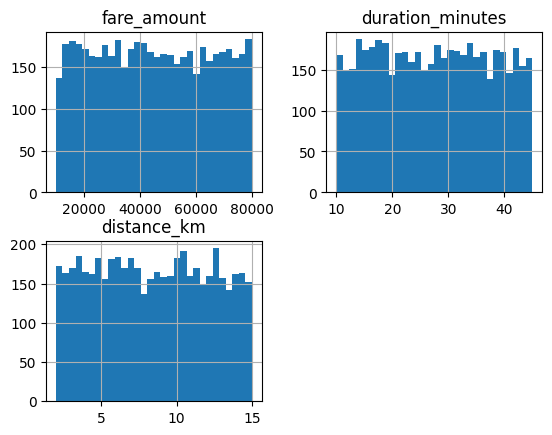

In [7]:
df_avg_trip[['fare_amount', 'duration_minutes', 'distance_km']].hist(bins=30)

### A.1 🧮 Statistik Deskriptif yang Umum Digunakan

### 📘 1. Central Tendency (Tendensi Sentral)
- Mean (rata-rata): menunjukkan nilai tengah rata-rata, bisa bias jika ada outlier.

- Median (nilai tengah): lebih robust terhadap outlier.

- Mode (nilai paling sering muncul): jika data bersifat kategorikal atau diskret.

In [8]:
df_avg_trip[['fare_amount', 'distance_km', 'duration_minutes']].mean()

fare_amount         44934.523600
distance_km             8.411424
duration_minutes       27.390880
dtype: float64

In [9]:
df_avg_trip[['fare_amount', 'distance_km', 'duration_minutes']].median()

fare_amount         44480.00
distance_km             8.43
duration_minutes       27.50
dtype: float64

### 📘 2. Dispersion (Sebaran)
- Standard deviation: mengukur variasi data dari rata-rata.

- Range (min–max): sebaran kasar.

- Interquartile range (IQR): range antara Q1 (25%) dan Q3 (75%).

In [10]:
df_avg_trip.describe()

,trip_id,pickup_latitude,pickup_longitude,dropoff_latitude,dropoff_longitude,distance_km,duration_minutes,fare_amount,surge_multiplier
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,2500.500000,-6.200634,106.822872,-6.199725,106.826921,8.411424,27.390880,44934.523600,1.742446
std,1443.520003,0.057927,0.071404,0.058154,0.071952,3.738313,10.057423,20253.734608,0.433695
min,1.000000,-6.299998,106.700013,-6.299968,106.700063,2.000000,10.000000,10001.000000,1.000000
25%,1250.750000,-6.251227,106.761786,-6.250567,106.765682,5.150000,18.600000,27475.250000,1.360000
50%,2500.500000,-6.199998,106.821493,-6.200761,106.828112,8.430000,27.500000,44480.000000,1.740000
75%,3750.250000,-6.150380,106.883343,-6.147876,106.887776,11.630000,35.900000,62803.750000,2.120000
max,5000.000000,-6.100056,106.949876,-6.100039,106.949981,15.000000,45.000000,79998.000000,2.500000


### 📘 3. Skewness & Kurtosis
Skewness: apakah distribusi condong ke kiri/kanan.

Kurtosis: apakah distribusi memiliki puncak tinggi atau lebar.

In [11]:
df_avg_trip[['fare_amount', 'duration_minutes', 'distance_km']].skew()

fare_amount         0.027193
duration_minutes    0.015846
distance_km         0.025813
dtype: float64

In [12]:
df_avg_trip[['fare_amount', 'duration_minutes', 'distance_km']].kurt()

fare_amount        -1.205013
duration_minutes   -1.197091
distance_km        -1.200928
dtype: float64

### A.2 ⏱️ Analisis Temporal

**Tujuan:** Mengamati distribusi pickup berdasarkan waktu (misalnya jam, hari)

**Syarat:** Kolom pickup_datetime harus tersedia.

**Dasar Teori:**

1. Ride-hailing demand biasanya bersifat temporal (jam sibuk, weekend).

2. Referensi: "Temporal analysis of ride-hailing services" - Wang et al., 2020

<Axes: xlabel='duration_minutes', ylabel='count'>

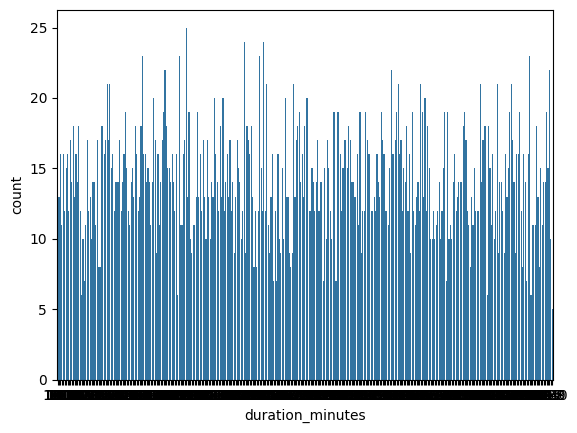

In [13]:
sns.countplot(x='duration_minutes',data=df_avg_trip)

### HARUS DIUBAH KE HOUR!!!!

## A.3 🌍 Insight Spasial

**Tujuan:** Menunjukkan distribusi pickup secara geografis

**Dasar Teori:**

1. Pola pickup cenderung mengelompok di pusat kota, terminal, pusat bisnis.

2. Referensi: "Understanding urban mobility patterns using spatial clustering" - Yuan et al.

In [14]:
from shapely import wkt

In [15]:
df_admin_jkt['wkt_geom'] = df_admin_jkt['wkt_geom'].apply(wkt.loads)

In [16]:
gdf_admin = gpd.GeoDataFrame(df_admin_jkt, geometry='wkt_geom', crs='EPSG:4326')

#### 1. PICKUP ZONE CLUSTERING ANALYSIS

Hitung jumlah pickup per area admin level 4

In [17]:
df_avg_trip.groupby('pickup_admin')['trip_id'].count().reset_index(name='pickup_trip_count').sort_values(by='pickup_trip_count', ascending=False)

,pickup_admin,pickup_trip_count
67,Halim Perdana Kusumah,100
96,Kamal Muara,78
102,Kapuk Muara,77
132,Kelapa Gading Barat,74
0,Ancol,69
...,...,...
268,Taman Sari,2
115,Kebagusan,1
59,Gondrong,1
99,Kampung Rawa,1


Hitung jumlah pickup per area admin level 4 dan diklasifikasikan berdasarkan type kendaraan

Hitung jumlah dropoff per area admin level 4

In [18]:
df_avg_trip.groupby('dropoff_admin')['trip_id'].count().reset_index(name='dropoff_trip_count').sort_values(by='dropoff_trip_count', ascending=False)

,dropoff_admin,dropoff_trip_count
67,Halim Perdana Kusumah,116
101,Kapuk Muara,77
0,Ancol,76
96,Kamal Muara,62
278,Tegal Alur,62
...,...,...
283,Ujung Menteng,2
59,Gondrong,1
48,Duri Selatan,1
63,Guntur,1


Hitung jumlah dropoff per area admin level 4 dan diklasifikasikan berdasarkan type kendaraan

In [19]:
df_avg_trip['pickup_geom'] = gpd.points_from_xy(df_avg_trip.pickup_longitude, df_avg_trip.pickup_latitude,crs="EPSG:4326")

In [20]:
df_avg_trip['dropoff_geom'] = gpd.points_from_xy(df_avg_trip.dropoff_longitude, df_avg_trip.dropoff_latitude,crs="EPSG:4326")

In [21]:
df_avg_trip.head()

,trip_id,pickup_datetime,dropoff_datetime,pickup_latitude,pickup_longitude,dropoff_latitude,dropoff_longitude,distance_km,duration_minutes,vehicle_type,fare_amount,surge_multiplier,pickup_admin,dropoff_admin,pickup_geohash,dropoff_geohash,pickup_geom,dropoff_geom
0,1,2024-01-01 00:00:00+00:00,2024-01-01 00:15:00+00:00,-6.225092,106.798409,-6.225272,106.824918,8.46,28.7,premium_car,39951.0,1.71,Gelora,Kuningan Timur,qqguw6b,qqguwfe,POINT (106.79841 -6.22509),POINT (106.82492 -6.22527)
1,2,2024-01-01 00:03:00+00:00,2024-01-01 00:18:00+00:00,-6.109857,106.818359,-6.233418,106.886687,3.67,44.8,premium_car,40325.0,1.46,None,Cipinang Muara,None,qquh830,POINT (106.81836 -6.10986),POINT (106.88669 -6.23342)
2,3,2024-01-01 00:06:00+00:00,2024-01-01 00:21:00+00:00,-6.153601,106.913637,-6.264769,106.840667,2.10,15.0,premium_car,34813.0,1.46,Pegangsaan Dua,Kalibata,qquhbzu,qqgur5w,POINT (106.91364 -6.1536),POINT (106.84067 -6.26477)
3,4,2024-01-01 00:09:00+00:00,2024-01-01 00:24:00+00:00,-6.180268,106.785001,-6.178547,106.720826,3.62,40.2,car,10623.0,1.26,Tanjung Duren Selatan,Duri Kosambi,qqguvfy,qqguu7p,POINT (106.785 -6.18027),POINT (106.72083 -6.17855)
4,5,2024-01-01 00:12:00+00:00,2024-01-01 00:27:00+00:00,-6.268796,106.917412,-6.204675,106.746395,14.43,27.4,motorcycle,67118.0,2.22,Jatiwaringin,Srengseng,None,qqgutn6,POINT (106.91741 -6.2688),POINT (106.7464 -6.20468)


In [22]:
gdf_pickup =  gpd.GeoDataFrame(df_avg_trip, geometry='pickup_geom', crs="EPSG:4326")
gdf_dropoff =  gpd.GeoDataFrame(df_avg_trip, geometry='dropoff_geom', crs="EPSG:4326")

In [23]:
gdf_pickup.head()

,trip_id,pickup_datetime,dropoff_datetime,pickup_latitude,pickup_longitude,dropoff_latitude,dropoff_longitude,distance_km,duration_minutes,vehicle_type,fare_amount,surge_multiplier,pickup_admin,dropoff_admin,pickup_geohash,dropoff_geohash,pickup_geom,dropoff_geom
0,1,2024-01-01 00:00:00+00:00,2024-01-01 00:15:00+00:00,-6.225092,106.798409,-6.225272,106.824918,8.46,28.7,premium_car,39951.0,1.71,Gelora,Kuningan Timur,qqguw6b,qqguwfe,POINT (106.79841 -6.22509),POINT (106.82492 -6.22527)
1,2,2024-01-01 00:03:00+00:00,2024-01-01 00:18:00+00:00,-6.109857,106.818359,-6.233418,106.886687,3.67,44.8,premium_car,40325.0,1.46,None,Cipinang Muara,None,qquh830,POINT (106.81836 -6.10986),POINT (106.88669 -6.23342)
2,3,2024-01-01 00:06:00+00:00,2024-01-01 00:21:00+00:00,-6.153601,106.913637,-6.264769,106.840667,2.10,15.0,premium_car,34813.0,1.46,Pegangsaan Dua,Kalibata,qquhbzu,qqgur5w,POINT (106.91364 -6.1536),POINT (106.84067 -6.26477)
3,4,2024-01-01 00:09:00+00:00,2024-01-01 00:24:00+00:00,-6.180268,106.785001,-6.178547,106.720826,3.62,40.2,car,10623.0,1.26,Tanjung Duren Selatan,Duri Kosambi,qqguvfy,qqguu7p,POINT (106.785 -6.18027),POINT (106.72083 -6.17855)
4,5,2024-01-01 00:12:00+00:00,2024-01-01 00:27:00+00:00,-6.268796,106.917412,-6.204675,106.746395,14.43,27.4,motorcycle,67118.0,2.22,Jatiwaringin,Srengseng,None,qqgutn6,POINT (106.91741 -6.2688),POINT (106.7464 -6.20468)


### Agregasi Jumlah Pickup dan Dropoff per Zona Administratif

In [24]:
pickup_agg = df_avg_trip.groupby('pickup_admin').agg(
    jumlah_trip=('trip_id', 'count'),
    rata_tarif=('fare_amount', 'mean'),
    rata_durasi=('duration_minutes', 'mean')
).reset_index()

pickup_agg.head()

,pickup_admin,jumlah_trip,rata_tarif,rata_durasi
0,Ancol,69,44701.956522,28.697101
1,Angke,8,49163.375000,30.200000
2,Bale Kambang,9,35822.333333,27.522222
3,Bali Mester,4,52627.000000,25.700000
4,Bangka,25,49026.000000,31.096000


In [25]:
dropoff_agg = df_avg_trip.groupby('dropoff_admin').agg(
    jumlah_trip=('trip_id', 'count'),
    rata_tarif=('fare_amount', 'mean'),
    rata_durasi=('duration_minutes', 'mean')
).reset_index()

dropoff_agg.head()

,dropoff_admin,jumlah_trip,rata_tarif,rata_durasi
0,Ancol,76,45366.986842,26.513158
1,Angke,11,46364.818182,27.736364
2,Bale Kambang,10,46261.200000,20.740000
3,Bali Mester,2,45954.500000,18.150000
4,Bangka,27,43776.074074,24.544444


### Clustering Zona Pickup (DBSCAN)

In [26]:
from sklearn.cluster import DBSCAN
import numpy as np

In [27]:
# Ambil koordinat pickup
coords = df_avg_trip[['pickup_latitude', 'pickup_longitude']].to_numpy()

In [28]:
# DBSCAN dalam satuan derajat
kms_per_radian = 6371.0088
epsilon = 0.5 / kms_per_radian  # 0.5 km

In [29]:
db = DBSCAN(eps=epsilon, min_samples=10, algorithm='ball_tree', metric='haversine').fit(np.radians(coords))

In [30]:
labels = db.fit_predict(np.radians(coords))

In [31]:
df_avg_trip['pickup_cluster'] = labels

In [32]:
# --- BUANG NOISE (label = -1) UNTUK AGREGASI ---
df_core = df_avg_trip[df_avg_trip['pickup_cluster'] != -1].copy()

In [33]:
# --- AGREGASI PER CLUSTER ---
cluster_agg = (
    df_core.groupby('pickup_cluster')
    .agg(
        trips=('trip_id', 'count'),
        avg_fare=('fare_amount', 'mean'),
        avg_duration=('duration_minutes', 'mean')
    )
    .reset_index()
    .sort_values('trips', ascending=False)
)

In [34]:
# --- CENTROID PER CLUSTER (lat/lon rata-rata sederhana) ---
centroids = (
    df_core.groupby('pickup_cluster')[['pickup_latitude', 'pickup_longitude']]
    .mean()
    .reset_index()
    .rename(columns={'pickup_latitude':'centroid_lat', 'pickup_longitude':'centroid_lon'})
)

In [35]:
cluster_summary = cluster_agg.merge(centroids, on='pickup_cluster', how='left')

In [36]:
cluster_summary.head()

,pickup_cluster,trips,avg_fare,avg_duration,centroid_lat,centroid_lon
0,4,107,44592.158879,29.200000,-6.174494,106.873174
1,2,75,44822.853333,29.208000,-6.163760,106.816994
2,6,72,46910.250000,27.133333,-6.138296,106.832654
3,9,64,44126.343750,25.384375,-6.285746,106.755948
4,32,51,40240.921569,27.898039,-6.220147,106.937827


In [37]:
import pydeck as pdk

In [38]:
required = [
    "pickup_latitude","pickup_longitude","fare_amount",
    "duration_minutes","trip_id","pickup_cluster"
]
missing = [c for c in required if c not in df_avg_trip.columns]
assert not missing, f"Missing columns: {missing}"


In [39]:
import numpy as np
import pandas as pd

def cluster_to_color(cid):
    if cid == -1:
        return [150,150,150,100]
    r = (37 * (cid + 1)) % 255
    g = (97 * (cid + 1)) % 255
    b = (173 * (cid + 1)) % 255
    return [int(r), int(g), int(b), 160]

def to_py_list(v):
    # pastikan list python murni, bukan numpy array
    return [int(v[0]), int(v[1]), int(v[2]), int(v[3])]


In [40]:
# Ambil hanya kolom yang dibutuhkan (hindari geometry / object aneh)
df_points = df_avg_trip[[
    "pickup_longitude","pickup_latitude",
    "pickup_cluster","fare_amount","duration_minutes","trip_id"
]].copy()

# Pastikan numerik tipe python
for c in ["pickup_longitude","pickup_latitude","fare_amount","duration_minutes"]:
    df_points[c] = pd.to_numeric(df_points[c], errors="coerce").astype(float)

df_points["pickup_cluster"] = df_points["pickup_cluster"].astype(int)

# Buat kolom posisi [lon, lat] (list python)
df_points["pos"] = df_points[["pickup_longitude","pickup_latitude"]].apply(
    lambda r: [float(r["pickup_longitude"]), float(r["pickup_latitude"])], axis=1
)

# Warna list python
df_points["color"] = df_points["pickup_cluster"].apply(cluster_to_color).apply(to_py_list)

# Drop baris yang ada NaN posisi
df_points = df_points.dropna(subset=["pickup_longitude","pickup_latitude"])


In [41]:
cluster_agg = (
    df_points[df_points["pickup_cluster"] != -1]
    .groupby("pickup_cluster")
    .agg(
        trips=("trip_id","count"),
        avg_fare=("fare_amount","mean"),
        avg_duration=("duration_minutes","mean"),
        centroid_lon=("pickup_longitude","mean"),
        centroid_lat=("pickup_latitude","mean"),
    )
    .reset_index()
)

# Pastikan tipe python + kolom posisi centroid
for c in ["trips","avg_fare","avg_duration","centroid_lon","centroid_lat","pickup_cluster"]:
    cluster_agg[c] = pd.to_numeric(cluster_agg[c], errors="coerce")

cluster_agg["pos"] = cluster_agg[["centroid_lon","centroid_lat"]].apply(
    lambda r: [float(r["centroid_lon"]), float(r["centroid_lat"])], axis=1
)

cluster_agg["color"] = cluster_agg["pickup_cluster"].astype(int).apply(cluster_to_color).apply(to_py_list)

# Skala tinggi kolom
max_trips = max(1, int(cluster_agg["trips"].max()))
cluster_agg["elevation"] = (cluster_agg["trips"] / max_trips * 800.0).astype(float)

# Label text
cluster_agg["label"] = cluster_agg.apply(lambda r: f"Cluster {int(r['pickup_cluster'])} ({int(r['trips'])})", axis=1)


In [42]:
INITIAL_VIEW_STATE = pdk.ViewState(
    latitude=float(df_points["pickup_latitude"].median()),
    longitude=float(df_points["pickup_longitude"].median()),
    zoom=11,
    pitch=0
)

points_layer = pdk.Layer(
    "ScatterplotLayer",
    df_points,
    get_position="pos",
    get_fill_color="color",
    get_radius=25,
    pickable=True,
    opacity=0.6
)

columns_layer = pdk.Layer(
    "ColumnLayer",
    cluster_agg,
    get_position="pos",
    get_elevation="elevation",
    elevation_scale=1,
    radius=120,
    get_fill_color="color",
    pickable=True,
    extruded=True
)

text_layer = pdk.Layer(
    "TextLayer",
    cluster_agg,
    get_position="pos",
    get_text="label",
    get_color="color",
    get_size=16,
    get_alignment_baseline="'bottom'",
    get_text_anchor="'middle'",
    pickable=False
)

tooltip = {
    "html": "<b>Cluster:</b> {pickup_cluster}<br/>"
            "<b>Trips:</b> {trips}<br/>"
            "<b>Avg Fare:</b> {avg_fare:.2f}<br/>"
            "<b>Avg Duration:</b> {avg_duration:.1f} min",
    "style": {"backgroundColor": "rgba(30,30,30,0.85)", "color": "white"}
}

r = pdk.Deck(
    layers=[points_layer, columns_layer, text_layer],
    initial_view_state=INITIAL_VIEW_STATE,
    tooltip=tooltip
)

r  # tampilkan di Jupyter
# Simpan ke HTML juga:
# r.to_html("pickup_clusters_pydeck.html", css_background_color="white", notebook_display=False)


{
  "initialViewState": {
    "latitude": -6.199998274884409,
    "longitude": 106.8214928935115,
    "pitch": 0,
    "zoom": 11
  },
  "layers": [
    {
      "@@type": "ScatterplotLayer",
      "data": [
        {
          "color": [
            150,
            150,
            150,
            100
          ],
          "duration_minutes": 28.7,
          "fare_amount": 39951.0,
          "pickup_cluster": -1,
          "pickup_latitude": -6.22509197623053,
          "pickup_longitude": 106.798408880069,
          "pos": [
            106.798408880069,
            -6.22509197623053
          ],
          "trip_id": 1
        },
        {
          "color": [
            150,
            150,
            150,
            100
          ],
          "duration_minutes": 44.8,
          "fare_amount": 40325.0,
          "pickup_cluster": -1,
          "pickup_latitude": -6.10985713871802,
          "pickup_longitude": 106.818358914844,
          "pos": [
            106.818358914844,
            -6.10985713871802
          ],
          "trip_id": 2
        },
        {
          "color": [
            155,
            110,
            70,
            160
          ],
          "duration_minutes": 15.0,
          "fare_amount": 34813.0,
          "pickup_cluster": 79,
          "pickup_latitude": -6.15360121163772,
          "pickup_longitude": 106.913636848301,
          "pos": [
            106.913636848301,
            -6.15360121163772
          ],
          "trip_id": 3
        },
        {
          "color": [
            150,
            150,
            150,
            100
          ],
          "duration_minutes": 40.2,
          "fare_amount": 10623.0,
          "pickup_cluster": -1,
          "pickup_latitude": -6.18026830316059,
          "pickup_longitude": 106.785001096515,
          "pos": [
            106.785001096515,
            -6.18026830316059
          ],
          "trip_id": 4
        },
        {
          "color": [
            37,
            97,
            173,
            160
          ],
          "duration_minutes": 27.4,
          "fare_amount": 67118.0,
          "pickup_cluster": 0,
          "pickup_latitude": -6.26879627191151,
          "pickup_longitude": 106.917412421203,
          "pos": [
            106.917412421203,
            -6.26879627191151
          ],
          "trip_id": 5
        },
        {
          "color": [
            86,
            191,
            154,
            160
          ],
          "duration_minutes": 10.8,
          "fare_amount": 17809.0,
          "pickup_cluster": 22,
          "pickup_latitude": -6.26880109593276,
          "pickup_longitude": 106.722033607744,
          "pos": [
            106.722033607744,
            -6.26880109593276
          ],
          "trip_id": 6
        },
        {
          "color": [
            150,
            150,
            150,
            100
          ],
          "duration_minutes": 44.0,
          "fare_amount": 79684.0,
          "pickup_cluster": -1,
          "pickup_latitude": -6.28838327756636,
          "pickup_longitude": 106.894199609302,
          "pos": [
            106.894199609302,
            -6.28838327756636
          ],
          "trip_id": 7
        },
        {
          "color": [
            74,
            194,
            91,
            160
          ],
          "duration_minutes": 43.8,
          "fare_amount": 64107.0,
          "pickup_cluster": 1,
          "pickup_latitude": -6.12676477084501,
          "pickup_longitude": 106.911886908264,
          "pos": [
            106.911886908264,
            -6.12676477084501
          ],
          "trip_id": 8
        },
        {
          "color": [
            150,
            150,
            150,
            100
          ],
          "duration_minutes": 23.4,
          "fare_amount": 50601.0,
          "pickup_cluster": -1,
          "pickup_latitude": -6.17977699765136,
          "pickup_longitude": 106.745454413209,
          "po

### JOIN DATA GEOPANDAS

In [43]:
gdf_pu_joined = gdf_admin.merge(
    pickup_agg,
    how='left',                      # bisa 'inner' kalau mau hanya yang match
    left_on='NAME_4',
    right_on='pickup_admin'
)

In [44]:
gdf_do_joined = gdf_admin.merge(
    dropoff_agg,
    how='left',                      # bisa 'inner' kalau mau hanya yang match
    left_on='NAME_4',
    right_on='dropoff_admin'
)

In [45]:
gdf_do_joined.head()

,NAME_1,NAME_2,NAME_3,NAME_4,wkt_geom,dropoff_admin,jumlah_trip,rata_tarif,rata_durasi
0,Jakarta Raya,Jakarta Selatan,Setiabudi,Kuningan Timur,"MULTIPOLYGON (((106.83234 -6.24002, 106.83277 ...",Kuningan Timur,18.0,41857.944444,25.644444
1,Jakarta Raya,Jakarta Selatan,Setiabudi,Menteng Atas,"MULTIPOLYGON (((106.83047 -6.21061, 106.83048 ...",Menteng Atas,11.0,44131.818182,26.590909
2,Jakarta Raya,Jakarta Selatan,Tebet,Bukit Duri,"MULTIPOLYGON (((106.86356 -6.22508, 106.86353 ...",Bukit Duri,7.0,57568.142857,33.828571
3,Jakarta Raya,Jakarta Selatan,Tebet,Kebon Baru,"MULTIPOLYGON (((106.8625 -6.2431, 106.86249 -6...",Kebon Baru,5.0,34691.400000,25.060000
4,Jakarta Raya,Jakarta Selatan,Tebet,Manggarai,"MULTIPOLYGON (((106.84815 -6.20792, 106.84821 ...",Manggarai,11.0,53378.363636,28.000000


### VISUALISASI HASIL INTERPRETASI

In [46]:
import folium

m = folium.Map(location=[-6.2, 106.8], zoom_start=12)

colors = {0: 'red', 1: 'blue', 2: 'green', -1: 'gray'}

for _, row in df_avg_trip.iterrows():
    folium.CircleMarker(
        location=[row['pickup_latitude'], row['pickup_longitude']],
        radius=2,
        color=colors.get(row['pickup_cluster'], 'black'),
        fill=True,
        fill_opacity=0.6
    ).add_to(m)

In [47]:
m

In [48]:
# ===== 0) Import
from shapely.geometry.base import BaseGeometry
from shapely import wkt, from_wkb

# ===== 1) Pastikan geometry siap pakai (EPSG:4326). Jika masih WKT, konversi.
def ensure_geometry(df, geom_col="geometry", fallback_col="wkt_geom", target_epsg=4326):
    """Pastikan GeoDataFrame punya kolom geometry (EPSG:4326).
    Menerima:
      - geometry sudah ada
      - WKT string di fallback_col
      - WKB bytes di fallback_col
      - atau langsung objek Shapely di fallback_col
    """
    # 1) kalau sudah ada geometry -> pakai
    if geom_col in df.columns:
        gdf = gpd.GeoDataFrame(df.copy(), geometry=geom_col, crs="EPSG:4326")
    else:
        if fallback_col not in df.columns:
            raise ValueError("Tidak menemukan kolom 'geometry' atau fallback kolom '%s'." % fallback_col)

        s = df[fallback_col]
        sample = s.dropna().iloc[0] if len(s.dropna()) else None

        if isinstance(sample, BaseGeometry):
            # sudah geometry, tinggal set
            gdf = gpd.GeoDataFrame(df.copy(), geometry=fallback_col, crs="EPSG:4326")
            gdf = gdf.rename(columns={fallback_col: geom_col})
            gdf.set_geometry(geom_col, inplace=True)

        elif isinstance(sample, (bytes, bytearray, memoryview)):
            # WKB bytes
            gdf = df.copy()
            gdf[geom_col] = gdf[fallback_col].apply(lambda b: from_wkb(b) if pd.notna(b) else None)
            gdf = gpd.GeoDataFrame(gdf, geometry=geom_col, crs="EPSG:4326")

        elif isinstance(sample, str):
            # WKT string
            gdf = df.copy()
            gdf[geom_col] = gdf[fallback_col].apply(lambda s: wkt.loads(s) if pd.notna(s) else None)
            gdf = gpd.GeoDataFrame(gdf, geometry=geom_col, crs="EPSG:4326")

        else:
            raise TypeError(f"Tipe data kolom '{fallback_col}' tidak dikenali: {type(sample)}")

    # 2) pastikan CRS 4326
    if gdf.crs is None:
        gdf.set_crs(epsg=target_epsg, inplace=True)
    elif gdf.crs.to_epsg() != target_epsg:
        gdf = gdf.to_crs(epsg=target_epsg)

    return gdf

gdf_pu = ensure_geometry(gdf_pu_joined)
gdf_do = ensure_geometry(gdf_do_joined)

# ===== 2) Explode multipolygon → polygon (pydeck PolygonLayer tidak terima Multi langsung)
gdf_pu_exp = gdf_pu.explode(index_parts=False, ignore_index=True)
gdf_do_exp = gdf_do.explode(index_parts=False, ignore_index=True)

# ===== 3) Skala gabungan (biar pickup & dropoff satu skala)
vmin = float(pd.concat([gdf_pu_exp["jumlah_trip"], gdf_do_exp["jumlah_trip"]]).min())
vmax = float(pd.concat([gdf_pu_exp["jumlah_trip"], gdf_do_exp["jumlah_trip"]]).max())
vrange = max(vmax - vmin, 1.0)

def to_rgb_red_high_green_low(v):
    """v : nilai jumlah_trip; merah=tinggi, hijau=rendah"""
    n = (float(v) - vmin) / vrange
    r = int(255 * n)         # naik → makin merah
    g = int(255 * (1 - n))   # turun → makin hijau
    return [r, g, 60, 160]   # alpha 160 supaya semi-transparan

# Skala elevasi (tinggi maksimum sekitar 3000)
def to_elevation(v, max_height=3000.0):
    n = (float(v) - vmin) / vrange
    return float(50.0 + n * max_height)

# ===== 4) Siapkan records untuk pydeck (list of dict)
def gdf_to_pydeck_records(gdf, layer_name):
    records = []
    for _, row in gdf.iterrows():
        geom = row.geometry
        if geom is None or geom.is_empty:
            continue
        # gunakan exterior saja untuk stabilitas (holes bisa ditambahkan jika perlu)
        ring = [[float(x), float(y)] for x, y in np.asarray(geom.exterior.coords)]
        records.append({
            "layer": layer_name,
            "polygon": ring,
            "jumlah_trip": float(row.get("jumlah_trip", 0.0)),
            "rata_tarif": float(row.get("rata_tarif", 0.0)),
            "rata_durasi": float(row.get("rata_durasi", 0.0)),
        })
    return records

pu_data = gdf_to_pydeck_records(gdf_pu_exp, "PICKUP")
do_data = gdf_to_pydeck_records(gdf_do_exp, "DROPOFF")

# beri color & elevation
for rec in pu_data + do_data:
    rec["color"] = to_rgb_red_high_green_low(rec["jumlah_trip"])
    rec["elevation"] = to_elevation(rec["jumlah_trip"])

# ===== 5) Basemap OpenStreetMap (tanpa token)
osm = pdk.Layer(
    "TileLayer",
    data="https://{s}.tile.openstreetmap.org/{z}/{x}/{y}.png",
    min_zoom=0, max_zoom=19, tile_size=256,
)

# ===== 6) Layers polygon 3D
pickup_layer = pdk.Layer(
    "PolygonLayer",
    pu_data,
    get_polygon="polygon",
    get_fill_color="color",
    get_elevation="elevation",
    pickable=True, extruded=True, wireframe=False,
    opacity=0.6
)

dropoff_layer = pdk.Layer(
    "PolygonLayer",
    do_data,
    get_polygon="polygon",
    get_fill_color="color",
    get_elevation="elevation",
    pickable=True, extruded=True, wireframe=False,
    opacity=0.35  # sedikit lebih transparan agar tidak menutupi pickup
)

# ===== 7) View & tooltip
# pusatkan kamera ke pusat gabungan
center_lat = float(pd.concat([gdf_pu_exp.geometry.centroid.y, gdf_do_exp.geometry.centroid.y]).mean())
center_lon = float(pd.concat([gdf_pu_exp.geometry.centroid.x, gdf_do_exp.geometry.centroid.x]).mean())

INITIAL_VIEW_STATE = pdk.ViewState(latitude=center_lat, longitude=center_lon, zoom=11, pitch=45, bearing=0)

tooltip = {
    "html": (
        "<b>Layer:</b> {layer}<br/>"
        "<b>Trips:</b> {jumlah_trip}<br/>"
        "<b>Avg Fare:</b> {rata_tarif}<br/>"
        "<b>Avg Duration (min):</b> {rata_durasi}"
    ),
    "style": {"backgroundColor": "rgba(30,30,30,0.85)", "color": "white"}
}

# ===== 8) Render
deck = pdk.Deck(
    layers=[osm, pickup_layer, dropoff_layer],
    initial_view_state=INITIAL_VIEW_STATE,
    map_style=None,
    tooltip=tooltip
)

deck  # tampil di Jupyter
# deck.to_html("pickup_dropoff_3d.html", notebook_display=False)  # simpan ke file


ValueError: cannot convert float NaN to integer